In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the urls dictionary
urls = {
    "loja_1": "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv",
    "loja_2": "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv",
    "loja_3": "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv",
    "loja_4": "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"
}

# Carregando os dados de cada loja
lojas = []
for nome, url in urls.items():
    df = pd.read_csv(url)
    df["Loja"] = nome
    lojas.append(df)

df_geral = pd.concat(lojas)
df_geral.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon,Loja
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79,loja_1
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66,loja_1
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86,loja_1
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50,loja_1
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38,loja_1


# 1. Análise do faturamento

In [13]:
faturamento = df_geral.groupby('Loja')['Preço'].sum().sort_values()
print("Faturamento por loja:")
print(faturamento)

Faturamento por loja:
Loja
loja_4    1384497.58
loja_3    1464025.03
loja_2    1488459.06
loja_1    1534509.12
Name: Preço, dtype: float64


# 2. Vendas por Categoria

In [14]:
categoria_popular = df_geral.groupby(['Loja', 'Categoria do Produto'])['Produto'].count()
categoria_popular = categoria_popular.groupby(level=0).idxmax().apply(lambda x: x[1])
print("Categoria mais popular por loja:")
print(categoria_popular)

Categoria mais popular por loja:
Loja
loja_1    moveis
loja_2    moveis
loja_3    moveis
loja_4    moveis
Name: Produto, dtype: object


# 3. Média de Avaliação das Lojas

In [15]:
# Remover espaços e padronizar nomes de colunas
df_geral.columns = df_geral.columns.str.strip()

# Calcular a média de avaliação por loja
avaliacoes = df_geral.groupby('Loja')['Avaliação da compra'].mean().sort_values()

# Exibir resultados
print("Média de avaliação por loja:")
print(avaliacoes)

Média de avaliação por loja:
Loja
loja_1    3.976685
loja_4    3.995759
loja_2    4.037304
loja_3    4.048326
Name: Avaliação da compra, dtype: float64


# 4. Produtos Mais e Menos Vendidos

In [16]:
mais_vendidos = df_geral.groupby(['Loja', 'Produto']).size().groupby(level=0).idxmax().apply(lambda x: x[1])
menos_vendidos = df_geral.groupby(['Loja', 'Produto']).size().groupby(level=0).idxmin().apply(lambda x: x[1])

print("Produto mais vendido por loja:")
print(mais_vendidos)
print("\nProduto menos vendido por loja:")
print(menos_vendidos)

Produto mais vendido por loja:
Loja
loja_1               Guarda roupas
loja_2    Iniciando em programação
loja_3               Kit banquetas
loja_4                    Cama box
dtype: object

Produto menos vendido por loja:
Loja
loja_1         Celular ABXY
loja_2    Jogo de tabuleiro
loja_3     Blocos de montar
loja_4             Guitarra
dtype: object


# 5. Frete Médio por Loja

In [17]:
frete_medio = df_geral.groupby('Loja')['Frete'].mean().sort_values()
print("Custo médio de frete por loja:")
print(frete_medio)

Custo médio de frete por loja:
Loja
loja_4    31.278997
loja_3    33.074464
loja_2    33.621941
loja_1    34.691805
Name: Frete, dtype: float64


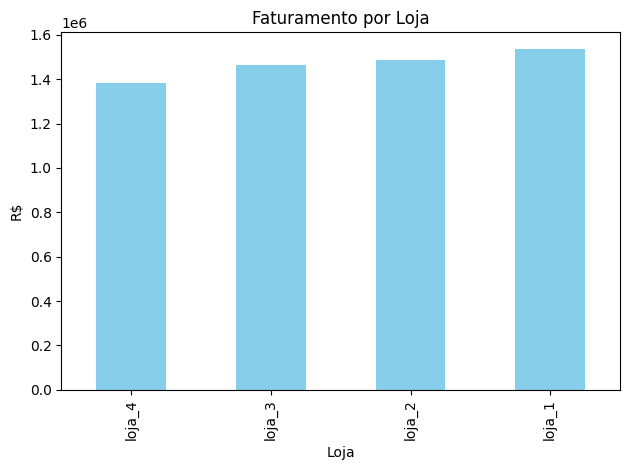

In [18]:
# Gráfico de Faturamento
faturamento.plot(kind='bar', title='Faturamento por Loja', ylabel='R$', xlabel='Loja', color='skyblue')
plt.tight_layout()
plt.show()

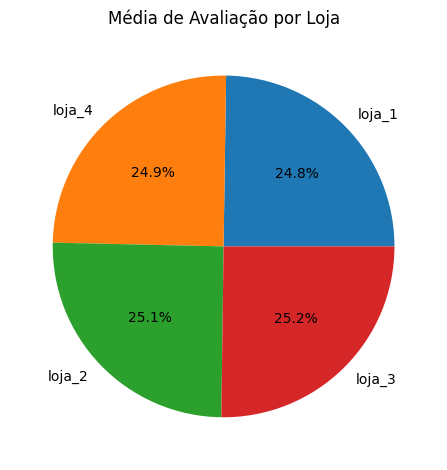

In [19]:
# Gráfico de Avaliações
avaliacoes.plot(kind='pie', title='Média de Avaliação por Loja', autopct='%.1f%%')
plt.ylabel('')
plt.tight_layout()
plt.show()

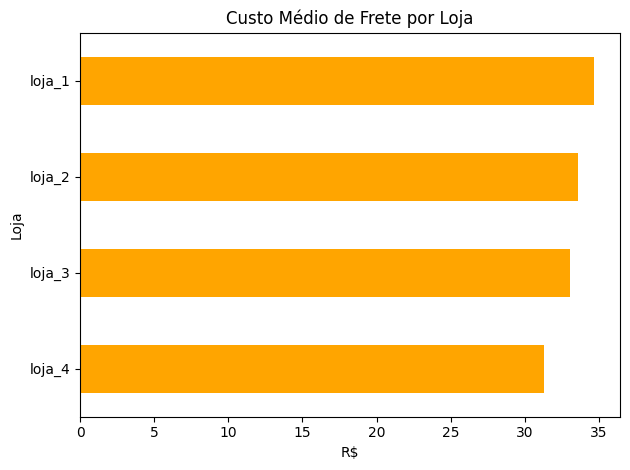

In [20]:
# Gráfico de Frete
frete_medio.plot(kind='barh', title='Custo Médio de Frete por Loja', color='orange')
plt.xlabel('R$')
plt.tight_layout()
plt.show()


## 📊 Relatório Final

**Análises realizadas:**
- A loja com o **menor faturamento** é a que menos gera receita.
- Verificamos a **categoria mais popular** por loja, importante para decisões de marketing.
- A loja com **menor média de avaliação** apresenta menor satisfação do cliente.
- Avaliamos os **produtos mais e menos vendidos** para entender desempenho de portfólio.
- **Custo médio de frete** pode indicar ineficiências logísticas.

**📌 Recomendação:**  
Com base no menor faturamento, menor média de avaliação e frete mais caro, recomendamos a venda da loja que apresenta o pior desempenho nestas métricas combinadas.

> ⚠️ Essa decisão pode ser ajustada considerando fatores estratégicos adicionais (ponto comercial, marca local, etc).

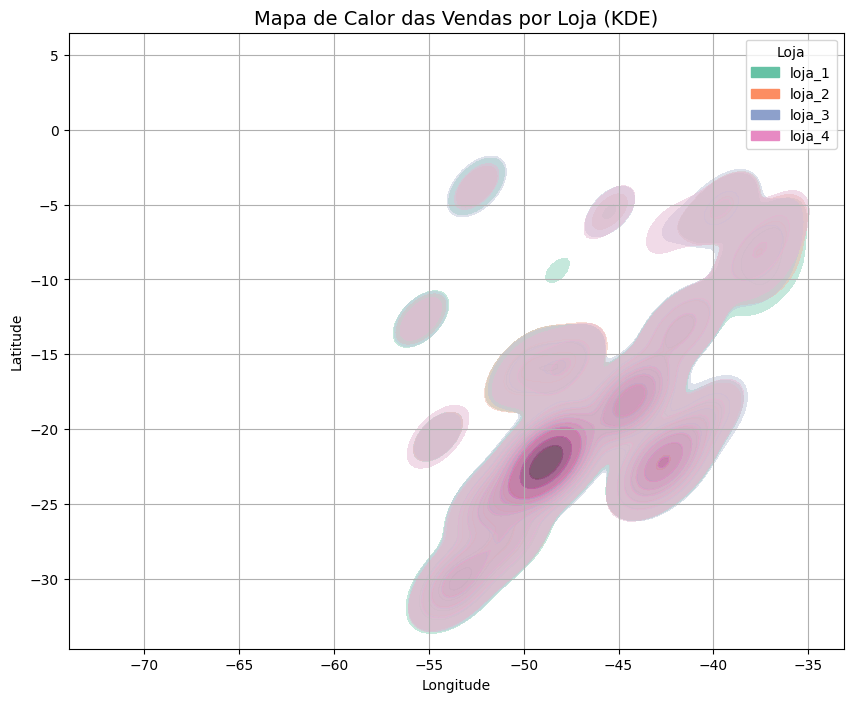

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.kdeplot(
    data=df_geral,
    x='lon', y='lat',
    hue='Loja',
    fill=True,
    common_norm=False,
    alpha=0.5,
    palette='Set2'
)
plt.title('Mapa de Calor das Vendas por Loja (KDE)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


In [22]:
import folium
from folium.plugins import MarkerCluster

# Criar o mapa centralizado
m = folium.Map(location=[df_geral['lat'].mean(), df_geral['lon'].mean()], zoom_start=6)

# Adiciona agrupamento de marcadores
marker_cluster = MarkerCluster().add_to(m)

# Cores diferentes por loja
cores_loja = {
    'loja_1': 'blue',
    'loja_2': 'green',
    'loja_3': 'purple',
    'loja_4': 'red'
}

# Adiciona marcadores
for _, row in df_geral.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        popup=f"Loja: {row['Loja']}\nProduto: {row['Produto']}\nPreço: R$ {row['Preço']:.2f}",
        color=cores_loja.get(row['Loja'], 'gray'),
        fill=True,
        fill_color=cores_loja.get(row['Loja'], 'gray'),
        fill_opacity=0.6
    ).add_to(marker_cluster)

# Exibe o mapa
m
